# Data processing stack

This notebook describes the pre-processing stack used to extract the training data.
Note: normalising the mel dB spectrum degrades the quality... using only audio?

In [1]:
import itertools
import os
import pickle
import shutil

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm.autonotebook import tqdm

########## Librosa implem
# from avgn.signalprocessing.create_spectrogram_dataset import prepare_wav
# from avgn.signalprocessing.spectrogramming import build_mel_basis, build_mel_inversion_basis, inv_spectrogram_librosa, \
#    spectrogram_librosa, _denormalize
# from avgn.signalprocessing.spectrogramming import griffinlim_librosa, _mel_to_linear
##########################################

########## Scipy implem
from avgn.signalprocessing.create_spectrogram_dataset import prepare_wav_sp 
from avgn.signalprocessing.spectrogramming_scipy import build_mel_basis_sp, build_mel_inversion_basis_sp, \
    inv_spectrogram_sp, spectrogram_sp, _denormalize_sp, \
    griffin_lim_sp, mel_to_linear_sp
##########################################

from avgn.utils.hparams import HParams

%matplotlib inline
import matplotlib.pyplot as plt
import IPython.display as ipd

<ipython-input-1-711a730b083d>:9: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


## Parameters

In [2]:
dataset_loc = '/home/leo/Code/birds_latent_generation/data/raw/voizo_chunks'
wav_loc = f'{dataset_loc}/Corvus/XCcorvus-Denoised/Kraai_BieslNp_120312-07xc_0_0.wav'

# Wave import
duration = 30 # reads the first "duration" seconds of the wave file
sr = 44100

# Spectrogramming
n_fft = 1024
#win_length_ms = (n_fft / 44100) * 1000 # None = no zero-padding, = n_fft
#hop_length_ms = (n_fft / 44100) * (1000 / 16) # None = 1/4 of win_length
win_length_ms = None
hop_length_ms = None
# Mel Spectro
num_mel_bins = 64
mel_lower_edge_hertz = 1000
mel_upper_edge_hertz = 12000
power = 1.5

# Normalising (mel-)spectro
ref_level_db = 40
min_level_db = -90

# Phase reconstruction (griffin-lim)
griffin_lim_iters = 50  # 50 should be largely sufficient 

## Read wave

In [3]:
hparams = HParams(
        sr=sr,
        num_mel_bins=num_mel_bins,
        n_fft=n_fft,
        mel_lower_edge_hertz=mel_lower_edge_hertz,
        mel_upper_edge_hertz=mel_upper_edge_hertz,
        power=power,  # for spectral inversion
        butter_lowcut=mel_lower_edge_hertz,
        butter_highcut=mel_upper_edge_hertz,
        ref_level_db=ref_level_db,  # default value = 20
        min_level_db=min_level_db,  # default value = -60
        mask_spec=False,
        win_length_ms=win_length_ms,
        hop_length_ms=hop_length_ms,
        mask_spec_kwargs={"spec_thresh": 0.9, "offset": 1e-10},
        n_jobs=1,
        verbosity=1,
        reduce_noise=True,
        noise_reduce_kwargs={"n_std_thresh": 2.0, "prop_decrease": 0.8},
        griffin_lim_iters=griffin_lim_iters
    )
suffix = hparams.__repr__()

/home/leo/Code/birds_latent_generation/data/dump/sr-44100_wl-None_hl-None_nfft-1024_chunkLen-1000_melb-64_mell-1000_melh-12000_pow-1.5


### prepare_wav does:
- read waves (chunk by chunk in case of large files)
- apply band-pass filtering (butterworth)
- apply reduce_noise function (spectral masking)

In [4]:
data, debug_data = prepare_wav_scipy(wav_loc, hparams, debug=True)
data = data[:hparams.sr * duration]
debug_data = {k: v[:hparams.sr * duration] for k, v in debug_data.items()}

In [5]:
def plot_wave(x, dB_plot):
    plt.figure(figsize=(14, 5))
    librosa.display.waveplot(x, sr=sr)
    X = librosa.stft(x)
    X = abs(X)
    X = librosa.amplitude_to_db(X)
    plt.figure(figsize=(14, 5))
    librosa.display.specshow(X, sr=sr, x_axis='time', y_axis='hz')

### Original audio

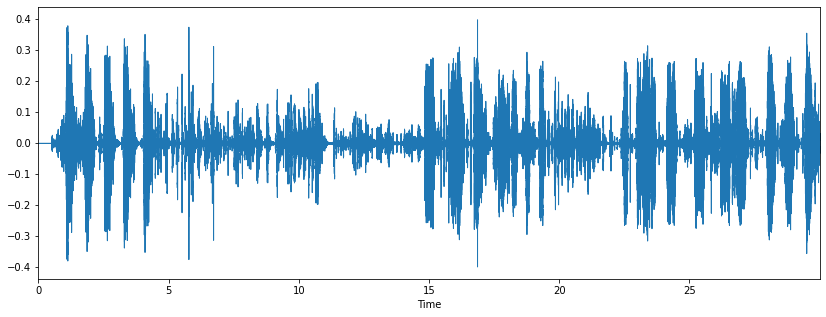

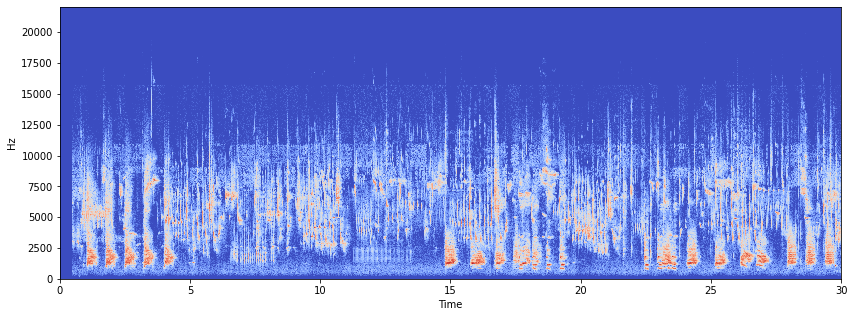

In [6]:
plot_wave(debug_data['x'], dB_plot=True)
ipd.Audio(debug_data['x'], rate=sr)

### Filtered audio

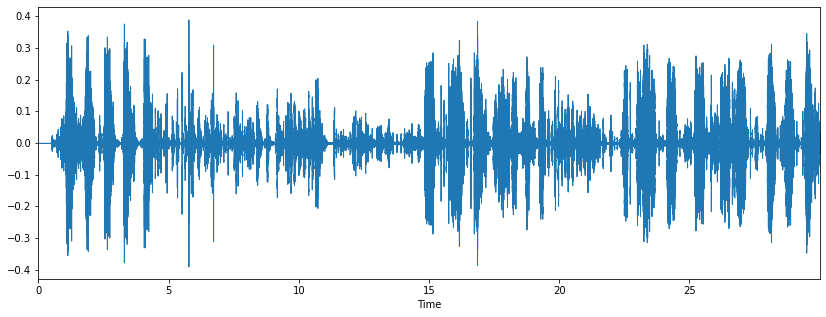

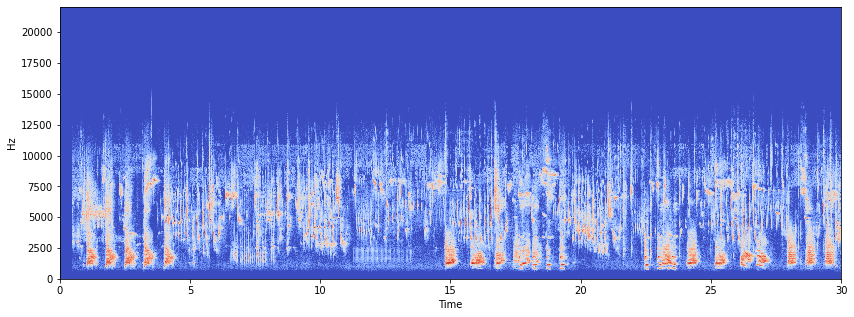

In [7]:
plot_wave(debug_data['x_filtered'], dB_plot=True)
ipd.Audio(debug_data['x_filtered'], rate=sr)

### Noise reduced audio 

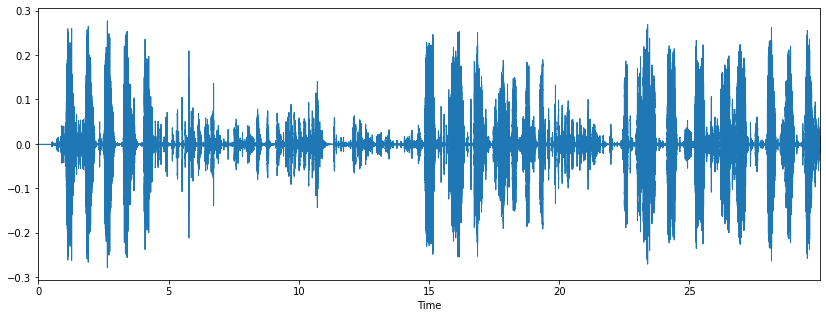

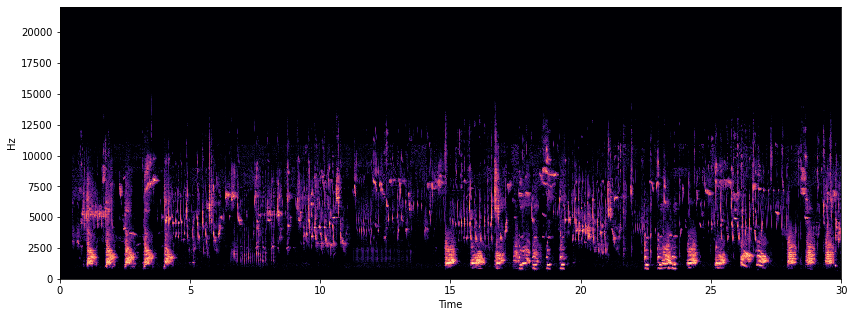

In [8]:
# x_rn = data returned by prepare_wav function
plot_wave(debug_data['x_rn'], dB_plot=True)
ipd.Audio(debug_data['x_rn'], rate=sr)

### Normalised audio

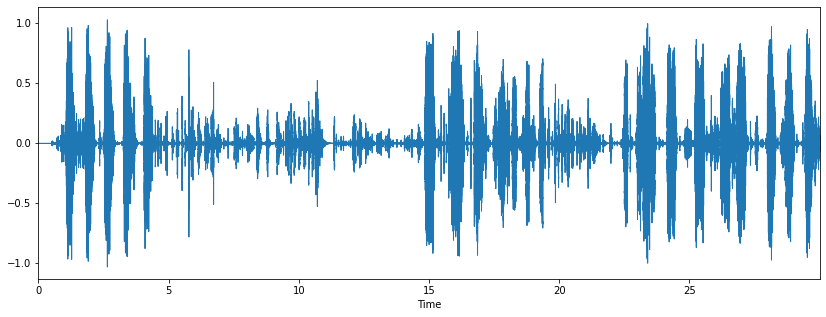

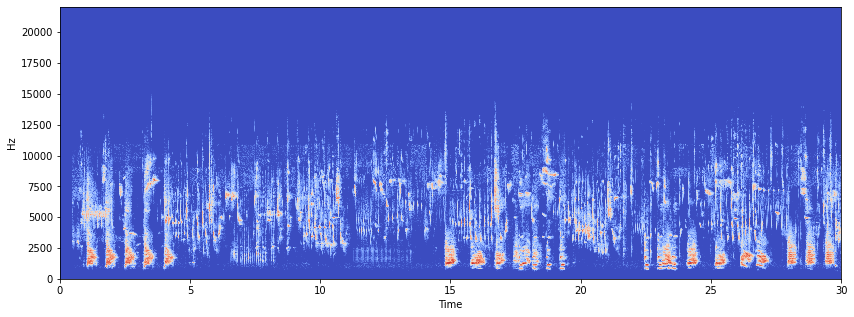

In [9]:
# Normalise audio
sn = data / np.max(data)
plot_wave(sn, dB_plot=True)
ipd.Audio(sn, rate=sr)

## Spectrogramming

In [10]:
mel_basis = build_mel_basis(hparams, hparams.sr, hparams.sr)
mel_inversion_basis = build_mel_inversion_basis(mel_basis)
mS, debug_info = spectrogram_librosa(sn, hparams, _mel_basis=mel_basis, debug=True)

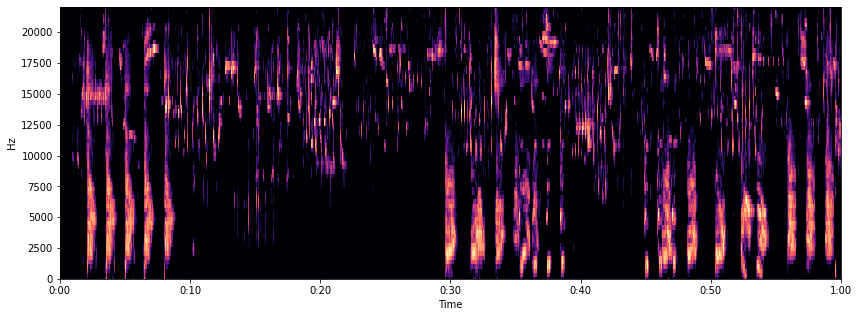

In [18]:
X = debug_info['mel_db_norm']
#X = abs(debug_info['mel_db_norm'])
#X = librosa.amplitude_to_db(X)
plt.figure(figsize=(14, 5))
librosa.display.specshow(X, sr=sr, x_axis='time', y_axis='hz')

### Amplitude spectrum

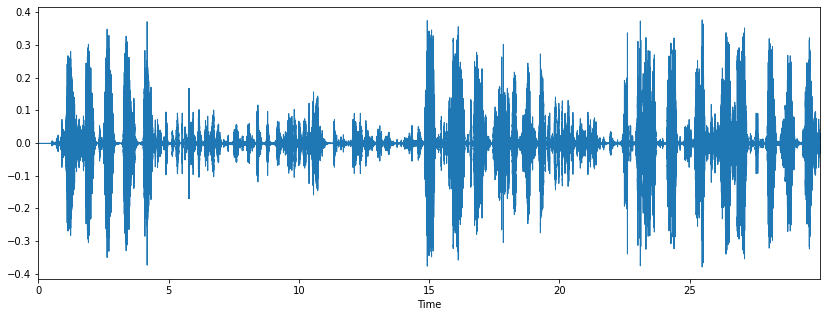

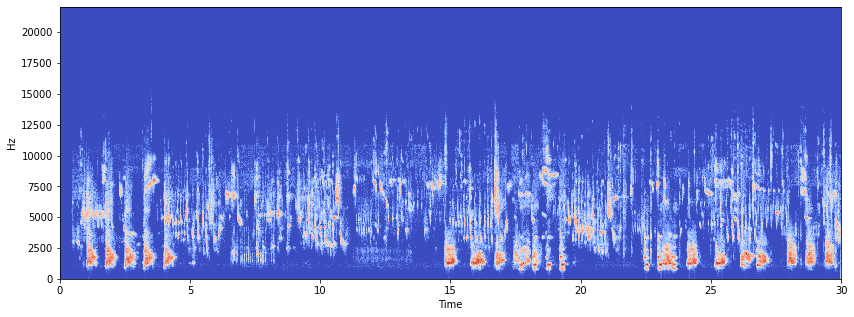

In [11]:
# S_abs
S_abs_inv = griffinlim_librosa(debug_info['S'], hparams.sr, hparams)
# S_angle_griffinlim = np.angle(librosa.core.stft(S_abs_inv))
# plt.matshow(S_angle_griffinlim, origin="lower")
plot_wave(S_abs_inv, dB_plot=True)
ipd.Audio(S_abs_inv, rate=sr)

### Mel

In [ ]:
mel_inv = griffinlim_librosa(
        _mel_to_linear(debug_info['mel'], _mel_inverse_basis=mel_inversion_basis)
        , hparams.sr, hparams)
plot_wave(mel_inv, dB_plot=True)
ipd.Audio(mel_inv, rate=sr)

### Mel dB

In [ ]:
aa_ = debug_info['mel_db'] + hparams.ref_level_db
bb_ = librosa.db_to_amplitude(aa_)
cc_ = _mel_to_linear(bb_, _mel_inverse_basis=mel_inversion_basis)
mel_db_inv = griffinlim_librosa(cc_, hparams.sr, hparams)
plot_wave(mel_db_inv, dB_plot=False)
ipd.Audio(mel_db_inv, rate=sr)

### Mel dB normalised

In [ ]:
plt.matshow(debug_info['mel_db_norm'][:, :64], origin="lower")
mel_db_norm_inv = inv_spectrogram_librosa(debug_info['mel_db_norm'], hparams.sr, hparams,
                                              mel_inversion_basis=mel_inversion_basis)
plot_wave(mel_db_norm_inv, dB_plot=False)
ipd.Audio(mel_db_norm_inv, rate=sr)